
Libraries used:
* pandas
* re
* numpy
* matplotlib
* sklearn
* gensim
* seaborn
* scipy
* os
* sklearn.model_selection
* gensim.models.fasttext
* sklearn.feature_extraction.text
* gensim.downloader
* sklearn.linear_model
* sklearn.metrics
* scipy.sparse
* gensim.corpora
* gensim.models.tfidfmodel
* gensim.matutils

### ----------------------------------------------------------------------------------------------------------------------------------------------------------------

- Generate feature representations of job description to predict (classify) jobs into one of the 8 categories such as IT, hospitality and Engineering etc. We will make use of 4 models to generate features - Bag of words, FastText, googlenews300 and Glove. Also, use these features to predict the category of each job description and compare the classification accuracy while using only title for classification, using only description for classification and using both title and description for classification. These experiments will be used to conclude our findings. 

## Importing libraries 

In [ ]:
# scientific ocomputation
import numpy as np

# regex
import re

# visulaization
import matplotlib.pyplot as plt

import seaborn as sns

# data analysis
import pandas as pd

# generate word embeddings
from gensim.models.fasttext import FastText

from sklearn.feature_extraction.text import CountVectorizer

from sklearn.feature_extraction.text import TfidfVectorizer

import gensim.downloader as api


# reduce dimensionality
from sklearn.manifold import TSNE

# classification model
from sklearn.model_selection import train_test_split

from sklearn.linear_model import LogisticRegression

from sklearn.metrics import confusion_matrix

from scipy.sparse import csr_matrix

from gensim.corpora import Dictionary

from gensim.models.tfidfmodel import TfidfModel

from gensim.matutils import sparse2full

import os

from sklearn.model_selection import KFold


# Generating Feature Representations for Job Ad Descriptions

Generate **different types of feature representations** for the collection of job advertisements.</span> 

- Consider the `description of the job advertisement`. 


- The feature representation to generate includes the following: 


    - `Bag-of-words model` :
     
        Generate the Count vector representation for each job advertisement description

        The generated Count vector representation must be based on the generated vocabulary in Task 1.

    - Models based on word embeddings:
    

        -- `FastText language model` trained based on the provided job ad descp, with a 200 embedding dimension
        -- `GoogleNews300`
        -- `Glove`


For each of the above mentioned language models, you are required to build the weighted (i.e., TF-IDF weighted) and unweighted vector representation for each job advertisement description.

## 2.1 Bag-of-words model

In [ ]:

vocab = []

with open("vocab.txt") as file: 
    
    word = file.readline()
    while word:
        end = word.find(":")
        vocab.append(word[:end]) 
        word = file.readline()        

In [ ]:
vocab

["a'level",
 'aa',
 'aaa',
 'aaappointments',
 'aab',
 'aac',
 'aacc',
 'aae',
 'aah',
 'aak',
 'aamm',
 'aan',
 'aand',
 'aantrekkelijk',
 'aap',
 'aar',
 'aarca',
 'aardman',
 'aareon',
 'aaron',
 'aaronwallis',
 'aarosette',
 'aarosettehotel',
 'aarosettelivein',
 'aarosetterestaurant',
 'aarosetterestaurantlondon',
 'aarosettes',
 'aarosettesinternationalchainofhotels',
 'aarosetteslivein',
 'aasl',
 'aasp',
 'aastra',
 'aat',
 'aatom',
 'ab',
 'aba',
 'abacus',
 'abaility',
 'abandoned',
 'abandonment',
 'abandons',
 'abap',
 'abaqus',
 'abatement',
 'abb',
 'abbas',
 'abbey',
 'abbeywood',
 'abbie',
 'abbot',
 'abbots',
 'abbott',
 'abby',
 'abbyy',
 'abc',
 'abd',
 'abdo',
 'abdominal',
 'abdul',
 'abdulla',
 'abel',
 'abellprotocoleducation',
 'abenefit',
 'aberdare',
 'aberdeen',
 "aberdeen's",
 'aberdeenshire',
 'aberdenshire',
 'aberfeldy',
 'abergavenny',
 'abertillery',
 'aberystwyth',
 'abfa',
 'abgeschlossenes',
 'abi',
 'abid',
 'abide',
 'abiding',
 'abigail',
 'abili'

In [ ]:
len(vocab)

40038

In [ ]:
# fetch all the processed job descriptions 

processed_job_descriptions = []

with open("job_ads.txt", "r") as file:
    
    word = file.readline()
    
    while word:
        
        # find starting index of Description
        result = word.find('Description:')
        
        # if the description does not exists, the result = -1
        # if description exists fetch job ad description
        if result > -1:
            #print(word)
            processed_job_descriptions.append(word[13:-1])
            
        word = file.readline() 
        

In [ ]:
processed_job_descriptions

['established manufacturer supplier quality water treatment plants ranging basic water softeners reverse osmosis equipment customer complex water treatment solutions meet clients requirements flexibility tailoring product budgets due expansion increased workload seeking recruit planet engineer cover accounts corridor responsibilities include conducting routine sampling analysis water systems interpreting results maintenance installation chemical dosing systems servicing accounts industrial commercial industries complete accordance approved code practice ideal applicant minimum years relevant industry reverse osmosis water softeners water filters uv equipment full driving license return offering competitive package ideal',
 'timeout children homes rapidly expanding forefront therapeutic care young people aged years emotional behavioural difficulties lives recruit residential care workers homes swindon area collaboratively cooperatively timeout staff young people external agencies consul

In [ ]:
# check if the length is the same as number of job files
len(processed_job_descriptions)

55449

In [ ]:
# create an instance of CountVectorizer to train bag of words model
# the vocabulary should be the vocab that we created
cVectorizer = CountVectorizer(analyzer = "word", vocabulary = vocab, binary=False)

In [ ]:
cVectorizer 

CountVectorizer(vocabulary=["a'level", 'aa', 'aaa', 'aaappointments', 'aab',
                            'aac', 'aacc', 'aae', 'aah', 'aak', 'aamm', 'aan',
                            'aand', 'aantrekkelijk', 'aap', 'aar', 'aarca',
                            'aardman', 'aareon', 'aaron', 'aaronwallis',
                            'aarosette', 'aarosettehotel', 'aarosettelivein',
                            'aarosetterestaurant', 'aarosetterestaurantlondon',
                            'aarosettes',
                            'aarosettesinternationalchainofhotels',
                            'aarosetteslivein', 'aasl', ...])

In [ ]:
# fit the model on job descriptions
count_features = cVectorizer.fit_transform(processed_job_descriptions)

In [ ]:
count_features.shape

(55449, 40038)

In [ ]:
count_features

<55449x40038 sparse matrix of type '<class 'numpy.int64'>'
	with 4734002 stored elements in Compressed Sparse Row format>

In [ ]:
# a method to validate count features or tfidf features generated for a given job index

def validator(data_features, vocab, a_ind, tokenised_articles):
    
    # print out the tokens of the job
    print("Tokens: \n")
    print(tokenised_articles[a_ind])
    
    print("--------------------------------------------\n")
    
    print("Vector representation:\n") 
    
    for word, value in zip(vocab, data_features.toarray()[a_ind]): 
        if value > 0:
            print(word+":"+str(value), end =' ')
                       

In [ ]:
validator(count_features, vocab, 10, processed_job_descriptions)

Tokens: 

behalf stable global leicester hunt project background point career developer ideally coming asp net background project managers due sheer growth project responsible defining scope projects resource requirements project governance accountable end end delivery risk managing relationships partners suppliers develop communication strategy engage stakeholders maintain wider track record project ideally qualified prince line beneficial delivering range systems intelligence data warehousing distribution transportation systems ideally areas past tangible developing realworld data driven applications opposed fancy websites gained industry complete software lifecycle preferably multiple methodology models agile practices methodologies test driven scrum savvy credibility front senior managers equally stuff technically asp net ensure continually challenged giving full projects involved ready interview immediately keen real passion drive offer applicant interested spec give full details 

In [ ]:
# to save the count_vectors.txt file we need web index of every article
web_indices = []
with open("web_indices.txt", "r") as file:
    
    web_index = file.readline()[:-1]
    
    while web_index:
        web_indices.append(web_index)
        web_index = file.readline()[:-1]
        

In [ ]:
len(web_indices)

55449

In [ ]:
# method which saves the count vector as per assignmnet specification

def write_vectorFile(data_features, filename, web_indices):
    
    # the number of document
    num = data_features.shape[0] 
    
    # creates a new txt file if it doesn't exists 
    out_file = open(filename, 'w') 
    
    for a_ind in range(0, num): 
        
        web_index = web_indices[a_ind]
        
        out_file.write("#" + web_index + ",")
        
        # for each word index that has non-zero entry in the data_feature
        for f_ind in data_features[a_ind].nonzero()[1]: 
            
            # retrieve the value of the entry from data_features
            value = data_features[a_ind][0, f_ind]
            
            if int(np.where(data_features[a_ind].nonzero()[1] == f_ind)[0]) == len(data_features[a_ind].nonzero()[1])-1:
                out_file.write("{}:{} ".format(f_ind,value))
                
            else:
                # write the entry to the file in the format of word_index:value
                out_file.write("{}:{},".format(f_ind,value)) 
        
        out_file.write('\n') 
        
    # close the file
    out_file.close() 

In [ ]:
# save the count features
write_vectorFile(count_features,"count_vectors.txt", web_indices)

In [ ]:
# save the generated tfidf vectors to train the weighted models later in the tasks
# save same files in a different way for further analysis, it saves files different than assignment requirement

def write_vectorFile_further(data_features,filename):
    
    # the number of document
    num = data_features.shape[0] 
    
    # creates a txt file and open to save the vector representation
    out_file = open(filename, 'w') 
    
    for a_ind in range(0, num): 
        
        for f_ind in data_features[a_ind].nonzero()[1]: 
            
            # retrieve the value of the entry from data_features
            value = data_features[a_ind][0,f_ind] 
        
            out_file.write("{}:{} ".format(f_ind,value)) 
               
        out_file.write('\n') 
        
    out_file.close() 

In [ ]:
# generate tdidf vectors for generating weighted word embeddings of decriptions

from sklearn.feature_extraction.text import TfidfVectorizer

# initialised the TfidfVectorizer
tVectorizer = TfidfVectorizer(analyzer = "word", vocabulary = vocab) 

# generate the tfidf vector representation for all articles
tfidf_features = tVectorizer.fit_transform(processed_job_descriptions) 

tfidf_features.shape

(55449, 40038)

In [ ]:
tfidf_features

<55449x40038 sparse matrix of type '<class 'numpy.float64'>'
	with 4734002 stored elements in Compressed Sparse Row format>

In [ ]:
# save tdidf features based on description only
write_vectorFile_further(tfidf_features,"tfidf_vectors.txt")

In [ ]:
# save count features based on description - without including web indices
write_vectorFile_further(count_features,"count_vectors_further.txt")

## 2.2 Models based on word embeddings

### Methods and dataframe to assist the task

In [ ]:
# we will need to create a corpus of all the tokenized and pre-processed job description for further use in the task

with open("corpus.txt", "w") as file:
    
    for i in range(0, len(processed_job_descriptions)):
        file.write(processed_job_descriptions[i] + "\n")

In [ ]:
# method to generate vector representation for documents - unweighted
def gen_docVecs(wv, tk_txts): 
    
    # creating empty final dataframe
    docs_vectors = pd.DataFrame()

    for i in range(0, len(tk_txts)):
        tokens = tk_txts[i]
        
        temp = pd.DataFrame() 
        
        for w_ind in range(0, len(tokens)): 
            try:
                word = tokens[w_ind]
                
                 # if word is present in embeddings then proceed
                word_vec = wv[word]
                
                temp = temp.append(pd.Series(word_vec), ignore_index = True) 
            except:
                pass
        
        # sum across rows of each column
        doc_vector = temp.sum() 
        
        # append each document value to the final dataframe
        docs_vectors = docs_vectors.append(doc_vector, ignore_index = True) 
        
    return docs_vectors

In [ ]:
filename = 'corpus.txt'
with open(filename) as txtf:
    
    # reading a list of strings, each for a document/article
    description_txts = txtf.read().splitlines() 
    
tokenized_description = [a.split(' ') for a in description_txts]

In [ ]:
tokenized_description

[['established',
  'manufacturer',
  'supplier',
  'quality',
  'water',
  'treatment',
  'plants',
  'ranging',
  'basic',
  'water',
  'softeners',
  'reverse',
  'osmosis',
  'equipment',
  'customer',
  'complex',
  'water',
  'treatment',
  'solutions',
  'meet',
  'clients',
  'requirements',
  'flexibility',
  'tailoring',
  'product',
  'budgets',
  'due',
  'expansion',
  'increased',
  'workload',
  'seeking',
  'recruit',
  'planet',
  'engineer',
  'cover',
  'accounts',
  'corridor',
  'responsibilities',
  'include',
  'conducting',
  'routine',
  'sampling',
  'analysis',
  'water',
  'systems',
  'interpreting',
  'results',
  'maintenance',
  'installation',
  'chemical',
  'dosing',
  'systems',
  'servicing',
  'accounts',
  'industrial',
  'commercial',
  'industries',
  'complete',
  'accordance',
  'approved',
  'code',
  'practice',
  'ideal',
  'applicant',
  'minimum',
  'years',
  'relevant',
  'industry',
  'reverse',
  'osmosis',
  'water',
  'softeners',
  

In [ ]:
df = pd.read_csv('ids_categories.csv')

In [ ]:
df.head()

,Unnamed: 0,Job_ID,Category
0,0,14624,Engineering
1,1,31567,Healthcare_Nursing
2,2,50131,Hospitality_Catering
3,3,31419,Healthcare_Nursing
4,4,47238,Teaching


In [ ]:
df.drop("Unnamed: 0", axis=1, inplace= True)

In [ ]:
df['article_text'] = processed_job_descriptions

In [ ]:
df['tk_text'] = tokenized_description

In [ ]:
df.head()

,Job_ID,Category,article_text,tk_text
0,14624,Engineering,established manufacturer supplier quality wate...,"[established, manufacturer, supplier, quality,..."
1,31567,Healthcare_Nursing,timeout children homes rapidly expanding foref...,"[timeout, children, homes, rapidly, expanding,..."
2,50131,Hospitality_Catering,french restaurant club gascon michelin establi...,"[french, restaurant, club, gascon, michelin, e..."
3,31419,Healthcare_Nursing,inpatient ward leader description patient lead...,"[inpatient, ward, leader, description, patient..."
4,47238,Teaching,information details relating selected review i...,"[information, details, relating, selected, rev..."


In [ ]:
# features as a numpy array, each element of the array is the document embedding of a job description

def plotTSNE(labels, features): 
    
    categories = sorted(labels.unique())
    
    # Sampling a subset of our dataset 
    SAMPLE_SIZE = int(len(features) * 0.3)
    
    np.random.seed(0)
    
    indices = np.random.choice(range(len(features)), size=SAMPLE_SIZE, replace=False)
    
    projected_features = TSNE(n_components=2, random_state=0).fit_transform(features[indices])
    
    # choose colors for different clusters - same as number of categories
    colors = ['pink', 'green', 'midnightblue', 'orange', 'darkgrey', 'red', 'blue', 'black']
    
    for i in range(0,len(categories)):
        points = projected_features[(labels[indices] == categories[i])]
        
        plt.scatter(points[:, 0], points[:, 1], s=30, c=colors[i], label=categories[i])
        
    plt.title("Feature vector for each article, projected on 2 dimensions.",
              fontdict=dict(fontsize=15))
    
    plt.legend()
    plt.show()

### Methods to assist the weighted models 

In [ ]:
def gen_vocIndex(voc_fname):
    
    with open(voc_fname) as vocf: 
        
        # read each line of the text file
        voc_Ind = [l.split(':') for l in vocf.read().splitlines()] 
        
        # return first element - index and 
        # second element - actual words in the vocab
    return {int(vi[1]):vi[0] for vi in voc_Ind}


# Generates the w_index:word dictionary
voc_fname = 'vocab.txt' 
voc_dict = gen_vocIndex(voc_fname)
voc_dict

{0: "a'level",
 1: 'aa',
 2: 'aaa',
 3: 'aaappointments',
 4: 'aab',
 5: 'aac',
 6: 'aacc',
 7: 'aae',
 8: 'aah',
 9: 'aak',
 10: 'aamm',
 11: 'aan',
 12: 'aand',
 13: 'aantrekkelijk',
 14: 'aap',
 15: 'aar',
 16: 'aarca',
 17: 'aardman',
 18: 'aareon',
 19: 'aaron',
 20: 'aaronwallis',
 21: 'aarosette',
 22: 'aarosettehotel',
 23: 'aarosettelivein',
 24: 'aarosetterestaurant',
 25: 'aarosetterestaurantlondon',
 26: 'aarosettes',
 27: 'aarosettesinternationalchainofhotels',
 28: 'aarosetteslivein',
 29: 'aasl',
 30: 'aasp',
 31: 'aastra',
 32: 'aat',
 33: 'aatom',
 34: 'ab',
 35: 'aba',
 36: 'abacus',
 37: 'abaility',
 38: 'abandoned',
 39: 'abandonment',
 40: 'abandons',
 41: 'abap',
 42: 'abaqus',
 43: 'abatement',
 44: 'abb',
 45: 'abbas',
 46: 'abbey',
 47: 'abbeywood',
 48: 'abbie',
 49: 'abbot',
 50: 'abbots',
 51: 'abbott',
 52: 'abby',
 53: 'abbyy',
 54: 'abc',
 55: 'abd',
 56: 'abdo',
 57: 'abdominal',
 58: 'abdul',
 59: 'abdulla',
 60: 'abel',
 61: 'abellprotocoleducation',
 

In [ ]:
def doc_wordweights(fName_tVectors, voc_dict):
    
    # a list to store the  word:weight dictionaries of documents
    tfidf_weights = [] 
    
    with open(fName_tVectors) as tVecf:
        
        # each line is a tfidf vector representation of a document in string format 
        # word_index:weight, word_index:weight 
        tVectors = tVecf.read().splitlines() 
        
    # for each tfidf document vector
    for tv in tVectors: 
        tv = tv.strip()
        
        # list of 'word_index:weight' entries
        weights = tv.split(' ') 
        
        # change the format of weight to a list of '[word_index,weight]' entries
        weights = [w.split(':') for w in weights] 
        
        # construct the weight dictionary, where each entry is 'word:weight'
        wordweight_dict = {voc_dict[int(w[0])]:w[1] for w in weights}
        
        tfidf_weights.append(wordweight_dict) 
        
    return tfidf_weights

In [ ]:
fName_tVectors = 'tfidf_vectors.txt'

tfidf_weights = doc_wordweights(fName_tVectors, voc_dict)

In [ ]:
tfidf_weights

[{'years': '0.041590542795583656',
  'workload': '0.07732175012039134',
  'water': '0.5286729566108767',
  'uv': '0.14982015121823747',
  'treatment': '0.16407476000533092',
  'tailoring': '0.12993687026598563',
  'systems': '0.0874279713366735',
  'supplier': '0.07259254600891585',
  'solutions': '0.046187881358403474',
  'softeners': '0.3220111352242161',
  'servicing': '0.08680694862092261',
  'seeking': '0.050286797021186276',
  'sampling': '0.12071529492890433',
  'routine': '0.0932573883599681',
  'reverse': '0.26741349387597624',
  'return': '0.058710613482731745',
  'results': '0.06350568212526252',
  'responsibilities': '0.044233371866369775',
  'requirements': '0.04039193437758663',
  'relevant': '0.04718681220880245',
  'recruit': '0.05243298838673115',
  'ranging': '0.08653069973907888',
  'quality': '0.0416852305217405',
  'product': '0.051321663794658495',
  'practice': '0.05799010332874837',
  'plants': '0.11640863076245764',
  'planet': '0.13457923751449027',
  'package

In [ ]:
# take a look at the tfidf word weights dictionary of the first document
tfidf_weights[0]

{'years': '0.041590542795583656',
 'workload': '0.07732175012039134',
 'water': '0.5286729566108767',
 'uv': '0.14982015121823747',
 'treatment': '0.16407476000533092',
 'tailoring': '0.12993687026598563',
 'systems': '0.0874279713366735',
 'supplier': '0.07259254600891585',
 'solutions': '0.046187881358403474',
 'softeners': '0.3220111352242161',
 'servicing': '0.08680694862092261',
 'seeking': '0.050286797021186276',
 'sampling': '0.12071529492890433',
 'routine': '0.0932573883599681',
 'reverse': '0.26741349387597624',
 'return': '0.058710613482731745',
 'results': '0.06350568212526252',
 'responsibilities': '0.044233371866369775',
 'requirements': '0.04039193437758663',
 'relevant': '0.04718681220880245',
 'recruit': '0.05243298838673115',
 'ranging': '0.08653069973907888',
 'quality': '0.0416852305217405',
 'product': '0.051321663794658495',
 'practice': '0.05799010332874837',
 'plants': '0.11640863076245764',
 'planet': '0.13457923751449027',
 'package': '0.048082241161251815',
 

In [ ]:
def gen_docVecs(wv,tk_txts,tfidf = []): # generate vector representation for documents
    docs_vectors = pd.DataFrame() # creating empty final dataframe
    #stopwords = nltk.corpus.stopwords.words('english') # removing stop words

    for i in range(0,len(tk_txts)):
        tokens = list(set(tk_txts[i])) # get the list of distinct words of the document

        temp = pd.DataFrame()  # creating a temporary dataframe(store value for 1st doc & for 2nd doc remove the details of 1st & proced through 2nd and so on..)
        for w_ind in range(0, len(tokens)): # looping through each word of a single document and spliting through space
            try:
                word = tokens[w_ind]
                word_vec = wv[word] # if word is present in embeddings(goole provides weights associate with words(300)) then proceed
                
                if tfidf != []:
                    word_weight = float(tfidf[i][word])
                else:
                    word_weight = 1
                temp = temp.append(pd.Series(word_vec*word_weight), ignore_index = True) # if word is present then append it to temporary dataframe
            except:
                pass
        doc_vector = temp.sum() # take the sum of each column(w0, w1, w2,........w300)
        docs_vectors = docs_vectors.append(doc_vector, ignore_index = True) # append each document value to the final dataframe
    return docs_vectors

### Generate word embeddings

### 2.2.1 FastText Unweighted - Description

In [ ]:
# 1. Set the corpus file names/path
corpus_file = 'corpus.txt'

# 2. Initialise the Fast Text model
jobAdFT = FastText(vector_size=200) 

# 3. build the vocabulary
jobAdFT.build_vocab(corpus_file=corpus_file)

# 4. train the model
jobAdFT.train(
    corpus_file=corpus_file, epochs=jobAdFT.epochs,
    total_examples=jobAdFT.corpus_count, total_words=jobAdFT.corpus_total_words,
)

print(jobAdFT)

2021-09-29 23:09:36,329 : INFO : FastText lifecycle event {'params': 'FastText(vocab=0, vector_size=200, alpha=0.025)', 'datetime': '2021-09-29T23:09:36.328494', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}
2021-09-29 23:09:36,334 : INFO : collecting all words and their counts
2021-09-29 23:09:36,337 : INFO : PROGRESS: at sentence #0, processed 0 words, keeping 0 word types
2021-09-29 23:09:36,595 : INFO : PROGRESS: at sentence #10000, processed 1132872 words, keeping 26067 word types
2021-09-29 23:09:36,805 : INFO : PROGRESS: at sentence #20000, processed 2254158 words, keeping 32732 word types
2021-09-29 23:09:37,013 : INFO : PROGRESS: at sentence #30000, processed 3369213 words, keeping 36403 word types
2021-09-29 23:09:37,224 : INFO : PROGRESS: at sentence #40000, processed 4506763 words, keeping 38518 word types
2021-09-29 23:09:37,454 : INFO : PROGRESS: at sentence #50000,

FastText(vocab=22816, vector_size=200, alpha=0.025)


In [ ]:
# fetch and assign all the vectors/word embeddings to a new variable
jobAdFT_wv = jobAdFT.wv
print(jobAdFT_wv)

In [ ]:
len(jobAdFT_wv)

22816

In [ ]:
# check the embedding size of each word
jobAdFT_wv.vector_size

200

In [ ]:
for index, word in enumerate(jobAdFT_wv.index_to_key):
    if index == 10:
        break
    print(f"word #{index}/{len(jobAdFT_wv.index_to_key)} is {word}")

word #0/22816 is sales
word #1/22816 is care
word #2/22816 is technical
word #3/22816 is design
word #4/22816 is clients
word #5/22816 is software
word #6/22816 is project
word #7/22816 is customer
word #8/22816 is ensure
word #9/22816 is systems


In [ ]:
# save the model
jobAdFT.save("jobAdFT.model")

2021-09-29 23:38:37,412 : INFO : FastText lifecycle event {'fname_or_handle': 'jobAdFT.model', 'separately': 'None', 'sep_limit': 10485760, 'ignore': frozenset(), 'datetime': '2021-09-29T23:38:37.412399', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'saving'}
2021-09-29 23:38:37,422 : INFO : storing np array 'vectors_ngrams' to jobAdFT.model.wv.vectors_ngrams.npy
2021-09-29 23:38:39,471 : INFO : not storing attribute vectors
2021-09-29 23:38:39,471 : INFO : not storing attribute buckets_word
2021-09-29 23:38:39,473 : INFO : not storing attribute cum_table
2021-09-29 23:38:39,526 : INFO : saved jobAdFT.model


In [ ]:
# load the saved model in case of dead kernel
jobAdFT = FastText.load("jobAdFT.model")

print(jobAdFT)

jobAdFT_wv= jobAdFT.wv

2021-09-29 23:38:41,990 : INFO : loading FastText object from jobAdFT.model
2021-09-29 23:38:42,032 : INFO : loading wv recursively from jobAdFT.model.wv.* with mmap=None
2021-09-29 23:38:42,033 : INFO : loading vectors_ngrams from jobAdFT.model.wv.vectors_ngrams.npy with mmap=None
2021-09-29 23:38:43,389 : INFO : setting ignored attribute vectors to None
2021-09-29 23:38:43,419 : INFO : setting ignored attribute buckets_word to None
2021-09-29 23:38:44,915 : INFO : setting ignored attribute cum_table to None
2021-09-29 23:38:45,055 : INFO : FastText lifecycle event {'fname': 'jobAdFT.model', 'datetime': '2021-09-29T23:38:45.055262', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'loaded'}


FastText(vocab=22816, vector_size=200, alpha=0.025)


In [ ]:
# generate document embeddings

jobAdFT_dvs = gen_docVecs(jobAdFT_wv, df['tk_text'])
jobAdFT_dvs.isna().any().sum()

0

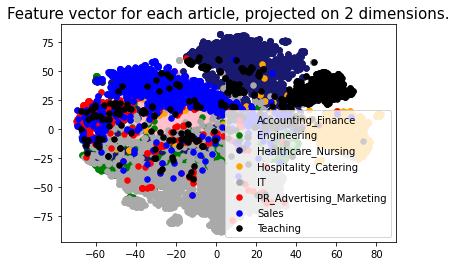

In [ ]:
# explore feature space

features = jobAdFT_dvs.to_numpy()
plotTSNE(df['Category'], features)

<span style='font-family:Georgia;color:Blue;background:yellow'>Obervation</span>

1. There is noise in the data.

2. Some categoies overlap.

3. overall different clusters can be observed.

### 2.2.2 FastText Weighted

In [ ]:
# generate features
weighted_jobAdFT_dvs = gen_docVecs(jobAdFT_wv,df['tk_text'], tfidf_weights)

In [ ]:
# check shape
weighted_jobAdFT_dvs.shape

(55449, 200)

In [ ]:
# first 5 values of the dataframe
# 200 columns, each represents dimension of the embedding
weighted_jobAdFT_dvs.head()

,0,1,2,3,4,5,6,7,8,9,...,190,191,192,193,194,195,196,197,198,199
0,5.570996,-0.952608,4.908416,1.182430,-0.470630,0.114472,-1.289792,2.620341,0.987553,4.310669,...,1.258890,-3.953095,-0.338229,0.497079,1.558904,3.805287,-5.880482,-2.165770,-0.483564,-1.432404
1,-1.239762,3.371543,1.580284,1.424815,-1.303332,3.930413,1.778008,2.292237,-5.380974,2.748441,...,-1.293839,0.931964,-5.957220,1.202322,-1.520283,3.392553,4.823896,-0.609019,-0.571813,-2.303823
2,1.531854,-3.246893,0.746347,0.405215,-2.109313,1.539463,-1.038306,-1.387730,1.432828,3.025691,...,-3.524013,2.600907,0.286237,-1.502907,0.974979,-0.014296,1.382721,1.979356,-3.050382,4.027256
3,1.046667,-0.225412,-4.638586,-1.387176,-3.087295,0.439467,1.299583,2.043389,-5.342844,-1.279748,...,0.490071,-0.264427,-2.595689,-0.735517,-2.010310,3.147662,3.673422,-2.308279,-2.892793,0.898251
4,3.084315,-3.319436,-0.115985,-1.232406,-3.171124,2.464792,1.693537,-1.217573,-0.907281,0.496076,...,-1.194609,-1.016122,-2.474510,-2.821038,0.638087,0.205518,-0.213697,-2.685552,-3.124216,-0.384721


In [ ]:
# save the generated dataframe into csv file
weighted_jobAdFT_dvs.to_csv('jobAdFT_dvs_weighted.csv') 

In [ ]:
# read the csv file into a dataframe when the notebook restarts

weighted_jobAdFT_dvs = pd.read_csv('jobAdFT_dvs_weighted.csv')

In [ ]:
weighted_jobAdFT_dvs.head()

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,190,191,192,193,194,195,196,197,198,199
0,0,2.928180,0.755896,4.125231,1.214472,-2.547303,0.016770,-0.384118,1.208666,-0.360407,...,3.335427,-3.525449,-4.668137,4.347139,0.669106,1.850718,-4.567778,0.053941,0.182776,-0.851154
1,1,-2.845365,2.956259,-0.437568,0.357851,-1.268400,2.374883,1.804719,1.302832,-5.765912,...,1.690002,3.574784,-6.609153,0.285941,-1.010019,1.357839,4.010597,-2.119635,-3.058808,-1.630591
2,2,0.055290,-2.163355,0.452660,2.435444,-2.168522,1.250604,-2.222243,-2.958654,3.790922,...,-0.912578,-1.041681,1.170115,1.123103,-2.264253,0.568959,3.381612,2.731423,-0.313606,1.324230
3,3,0.091208,0.107125,-4.651918,-3.538827,-2.207789,0.472319,1.428605,-0.864574,-4.768573,...,1.355508,0.362379,-5.628305,1.987155,-1.359214,-0.127499,3.536230,-4.575963,-1.496257,-1.872885
4,4,2.104263,-2.978553,-0.653408,-0.557803,-2.800791,2.649867,2.346873,-1.292986,-1.026995,...,2.279632,-0.167490,-2.629904,-0.146372,-1.551691,-3.481757,-0.320376,-1.386551,-2.062284,0.205036


In [ ]:
weighted_jobAdFT_dvs.drop("Unnamed: 0", axis=1, inplace=True)

In [ ]:
weighted_jobAdFT_dvs.head()

,0,1,2,3,4,5,6,7,8,9,...,190,191,192,193,194,195,196,197,198,199
0,2.928180,0.755896,4.125231,1.214472,-2.547303,0.016770,-0.384118,1.208666,-0.360407,3.172183,...,3.335427,-3.525449,-4.668137,4.347139,0.669106,1.850718,-4.567778,0.053941,0.182776,-0.851154
1,-2.845365,2.956259,-0.437568,0.357851,-1.268400,2.374883,1.804719,1.302832,-5.765912,1.927296,...,1.690002,3.574784,-6.609153,0.285941,-1.010019,1.357839,4.010597,-2.119635,-3.058808,-1.630591
2,0.055290,-2.163355,0.452660,2.435444,-2.168522,1.250604,-2.222243,-2.958654,3.790922,2.890681,...,-0.912578,-1.041681,1.170115,1.123103,-2.264253,0.568959,3.381612,2.731423,-0.313606,1.324230
3,0.091208,0.107125,-4.651918,-3.538827,-2.207789,0.472319,1.428605,-0.864574,-4.768573,-2.222586,...,1.355508,0.362379,-5.628305,1.987155,-1.359214,-0.127499,3.536230,-4.575963,-1.496257,-1.872885
4,2.104263,-2.978553,-0.653408,-0.557803,-2.800791,2.649867,2.346873,-1.292986,-1.026995,0.865236,...,2.279632,-0.167490,-2.629904,-0.146372,-1.551691,-3.481757,-0.320376,-1.386551,-2.062284,0.205036


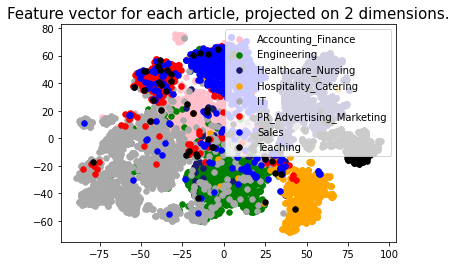

In [ ]:
features = weighted_jobAdFT_dvs.to_numpy()

plotTSNE(df['Category'], features)

<span style='font-family:Georgia;color:Blue;background:yellow'>Obervation</span>

1. There is noise in the data.

2. Some categoies overlap.

3. `Engineering` seems overlap with `IT` which is plausible given similarity in their descriptions. 


4. `PR_Advertising_Marketing` and `Sales` seems to have a lot in common, which is the case in real life as well.


### 2.2.3 GoogleNews300 unweighted - Descriptions 

In [ ]:
# load the model
preTW2v_wv = api.load('word2vec-google-news-300')

In [ ]:
preTW2v_dvs = gen_docVecs(preTW2v_wv, df['tk_text'])

# check if there are any null values
preTW2v_dvs.isna().any().sum()

0

In [ ]:
# for 55449 documents 300 size embedding were generated
preTW2v_dvs.shape

(55449, 300)

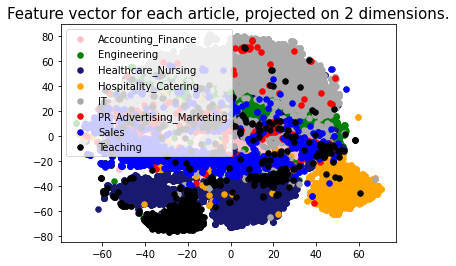

In [ ]:
# convert the document vector dataframe to a numpy array
features = preTW2v_dvs.to_numpy() 

# plot the tSNE to have a look
plotTSNE(df['Category'],features) 

<span style='font-family:Georgia;color:Blue;background:yellow'>Obervation</span>

1. There is noise in the data.

2. Some categoies overlap.

3. Overall different clusters can be observed. 

4. `PR_Advertising_Marketing` seems to be least clustered and is spread across various other clusters.

In [ ]:
# saving the dataframe 
preTW2v_dvs.to_csv('GoogleNews300_unweighted.csv') 

In [ ]:
# read the csv file into a dataframe when the notebook restarts

preTW2v_dvs = pd.read_csv('GoogleNews300_unweighted.csv')

In [ ]:
preTW2v_dvs.head()

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,290,291,292,293,294,295,296,297,298,299
0,0,-4.546768,5.067925,2.481800,2.889145,-5.867694,1.922361,1.819260,-5.643738,3.034363,...,-6.215942,2.623596,-4.843262,4.526444,0.330536,0.752022,-0.174652,-0.364319,4.098686,-3.404217
1,1,-0.872101,0.557505,-0.474548,4.512268,-2.706406,-0.602787,3.192154,-3.002121,4.646362,...,-3.955048,1.782196,-7.212727,-0.014885,-0.591583,1.429382,0.405249,-1.993744,1.269203,-0.962341
2,2,-3.478378,1.442741,-1.097778,4.933929,-1.868793,1.896019,-0.223526,-5.567322,3.622606,...,-2.116924,2.591629,-3.594101,2.625061,0.972580,-1.445465,0.002319,-1.612640,0.562153,-2.285095
3,3,-3.872299,2.042828,0.468018,0.002045,-2.529800,0.126999,1.607147,-4.834270,5.598373,...,-3.095764,1.786911,-3.837097,3.178623,-1.668671,1.535706,-0.629822,-0.707443,3.304611,1.170349
4,4,-2.315674,0.330042,0.247406,1.883667,-1.592896,-1.544556,2.662231,-4.661743,3.335389,...,-3.004673,2.648071,-3.676279,0.199734,2.657959,-0.829605,1.010836,-3.689674,-0.146606,-1.210449


In [ ]:
preTW2v_dvs.drop("Unnamed: 0", axis=1, inplace=True)

In [ ]:
preTW2v_dvs.head()

,0,1,2,3,4,5,6,7,8,9,...,290,291,292,293,294,295,296,297,298,299
0,-4.546768,5.067925,2.481800,2.889145,-5.867694,1.922361,1.819260,-5.643738,3.034363,2.692573,...,-6.215942,2.623596,-4.843262,4.526444,0.330536,0.752022,-0.174652,-0.364319,4.098686,-3.404217
1,-0.872101,0.557505,-0.474548,4.512268,-2.706406,-0.602787,3.192154,-3.002121,4.646362,-4.292419,...,-3.955048,1.782196,-7.212727,-0.014885,-0.591583,1.429382,0.405249,-1.993744,1.269203,-0.962341
2,-3.478378,1.442741,-1.097778,4.933929,-1.868793,1.896019,-0.223526,-5.567322,3.622606,2.308132,...,-2.116924,2.591629,-3.594101,2.625061,0.972580,-1.445465,0.002319,-1.612640,0.562153,-2.285095
3,-3.872299,2.042828,0.468018,0.002045,-2.529800,0.126999,1.607147,-4.834270,5.598373,-3.731567,...,-3.095764,1.786911,-3.837097,3.178623,-1.668671,1.535706,-0.629822,-0.707443,3.304611,1.170349
4,-2.315674,0.330042,0.247406,1.883667,-1.592896,-1.544556,2.662231,-4.661743,3.335389,-0.686310,...,-3.004673,2.648071,-3.676279,0.199734,2.657959,-0.829605,1.010836,-3.689674,-0.146606,-1.210449


### 2.2.4 GoogleNews300 Weighted - Description

In [ ]:
weighted_preTW2v_dvs = gen_docVecs(preTW2v_wv, df['tk_text'], tfidf_weights)

In [ ]:
weighted_preTW2v_dvs.shape

(55449, 300)

In [ ]:
# save the generated dataframe into csv file
weighted_preTW2v_dvs.to_csv('GoogleNews300_weighted.csv') 

In [ ]:
# read the csv file into a dataframe when the notebook restarts

weighted_preTW2v_dvs = pd.read_csv('GoogleNews300_weighted.csv')

In [ ]:
weighted_preTW2v_dvs.head()

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,290,291,292,293,294,295,296,297,298,299
0,0,-0.302032,0.526961,0.315191,0.250016,-0.560328,0.195893,0.004300,-0.502256,0.169858,...,-0.378331,0.255053,-0.346347,0.316490,-0.032879,-0.007107,-0.156081,0.028220,0.504951,-0.128035
1,1,-0.003248,-0.003575,0.073574,0.527859,-0.303890,-0.131595,0.384705,-0.516143,0.558472,...,-0.405291,0.132163,-0.712608,-0.052194,0.063288,0.098001,0.009755,-0.183310,0.006334,-0.071553
2,2,-0.335082,0.076049,-0.053175,0.516773,-0.164520,0.147430,-0.091770,-0.615416,0.428481,...,-0.171250,0.295379,-0.380009,0.303032,0.146104,-0.115367,-0.007464,-0.261947,0.068285,-0.239664
3,3,-0.439928,0.252414,0.057091,0.011737,-0.217959,0.065631,0.042823,-0.401027,0.444185,...,-0.329725,0.103665,-0.405577,0.398221,-0.134233,0.132578,-0.165667,-0.020987,0.294105,0.225049
4,4,-0.250598,0.103531,0.084550,0.442688,-0.193634,-0.244948,0.362249,-0.639101,0.367653,...,-0.376406,0.299882,-0.543405,0.099114,0.421156,-0.084770,0.170544,-0.478934,0.082148,0.015700


In [ ]:
weighted_preTW2v_dvs.drop("Unnamed: 0", axis=1, inplace=True)

In [ ]:
weighted_preTW2v_dvs.head()

,0,1,2,3,4,5,6,7,8,9,...,290,291,292,293,294,295,296,297,298,299
0,-0.302032,0.526961,0.315191,0.250016,-0.560328,0.195893,0.004300,-0.502256,0.169858,0.233329,...,-0.378331,0.255053,-0.346347,0.316490,-0.032879,-0.007107,-0.156081,0.028220,0.504951,-0.128035
1,-0.003248,-0.003575,0.073574,0.527859,-0.303890,-0.131595,0.384705,-0.516143,0.558472,-0.645102,...,-0.405291,0.132163,-0.712608,-0.052194,0.063288,0.098001,0.009755,-0.183310,0.006334,-0.071553
2,-0.335082,0.076049,-0.053175,0.516773,-0.164520,0.147430,-0.091770,-0.615416,0.428481,0.280967,...,-0.171250,0.295379,-0.380009,0.303032,0.146104,-0.115367,-0.007464,-0.261947,0.068285,-0.239664
3,-0.439928,0.252414,0.057091,0.011737,-0.217959,0.065631,0.042823,-0.401027,0.444185,-0.382661,...,-0.329725,0.103665,-0.405577,0.398221,-0.134233,0.132578,-0.165667,-0.020987,0.294105,0.225049
4,-0.250598,0.103531,0.084550,0.442688,-0.193634,-0.244948,0.362249,-0.639101,0.367653,-0.032226,...,-0.376406,0.299882,-0.543405,0.099114,0.421156,-0.084770,0.170544,-0.478934,0.082148,0.015700


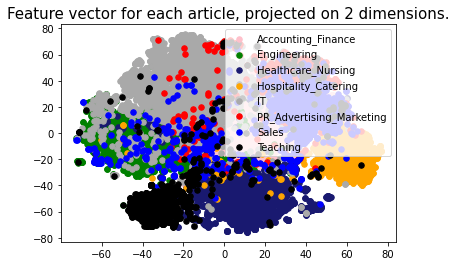

In [ ]:
features = weighted_preTW2v_dvs.to_numpy()

plotTSNE(df['Category'], features)

<span style='font-family:Georgia;color:Blue;background:yellow'>Obervation</span>

1. There is noise in the data.

2. Some categoies overlap.

3. `Engineering` seems overlap with `IT` which is plausible given similarity in their descriptions. 


4. `Accounting_Finance` seems to overlap with Sales.

5. `PR_Advertising_Marketing` and `Sales` seems to have a lot in common, which is the case in real life as well.


### 2.2.5 Glove unweighted - Description

In [ ]:
# specify the path to the embedding file
path_to_glove_file = os.path.join("glove/glove.6B.100d.txt") 

# initialise an empty dcitionary
preTGloVe_wv = {} 


with open(path_to_glove_file, encoding="utf-8") as f: 
    for line in f:
        # The maxsplit defines the maximum number of splits. 
        word, coefs = line.split(maxsplit=1) 
         
        # construct an numpy array from the string 'coefs',
        coefs = np.fromstring(coefs, "f", sep=" ")  
                                                   
        # map word and embedding 
        preTGloVe_wv[word] = coefs 

print("Found %s word vectors." % len(preTGloVe_wv))

Found 400000 word vectors.


In [ ]:
# generate embedding based on google news 300 pretrained model

# generate document embeddings
preTGloVe_dvs = gen_docVecs(preTGloVe_wv, df['tk_text']) 

# check whether there is any null values in the document vectors dataframe.
preTGloVe_dvs.isna().any().sum() 

0

In [ ]:
preTGloVe_dvs.head()

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,-8.452854,14.031649,8.487294,10.591994,2.899995,-26.539415,-8.164433,23.129335,-7.460888,20.630583,...,1.477784,-6.770643,-10.204730,-10.854679,-7.677034,11.681058,-9.111891,-24.778807,51.175449,11.640915
1,3.188364,12.107277,-6.882767,4.265330,-4.751654,11.434958,-7.835027,7.645489,8.320374,7.924747,...,-0.355723,-5.701750,7.989813,-6.567437,-18.705715,7.136400,-1.257331,-9.285749,28.167175,1.076982
2,1.312442,0.286572,1.147939,8.896879,2.561187,3.218202,-1.229301,17.014334,-7.106492,4.619921,...,-0.716732,0.404090,1.759186,-2.446499,-30.881174,6.985052,-1.625517,-3.927140,29.036037,9.946154
3,-10.756304,0.501113,1.000637,2.074277,-2.269654,4.278641,0.178384,15.023031,-11.033583,3.905212,...,8.083795,-7.336697,11.190885,7.020222,-15.551013,21.196249,12.814676,-9.916018,28.840475,-3.744047
4,-3.601251,2.474471,4.130974,4.287502,8.829601,-3.771069,-1.161650,7.273405,-2.751902,6.515315,...,-5.329549,4.183966,1.668574,9.890047,-9.210768,4.900214,4.751750,-5.296153,18.912979,3.995602


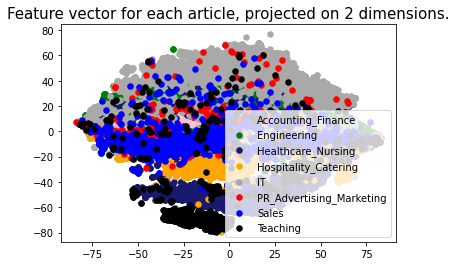

In [ ]:
features = preTGloVe_dvs.to_numpy()
plotTSNE(df['Category'],features)

<span style='font-family:Georgia;color:Blue;background:yellow'>Obervation</span>

1. There is less noise in the data as compared with Google news model and FastText model.

2. Some categoies overlap.

3. overall different clusters can be observed.

In [ ]:
preTGloVe_dvs.to_csv('Glove_unweighted.csv') 

In [ ]:
# read the csv file into a dataframe when the notebook restarts

preTGloVe_dvs = pd.read_csv('Glove_unweighted.csv')

In [ ]:
preTGloVe_dvs.head()

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,90,91,92,93,94,95,96,97,98,99
0,0,-8.452854,14.031649,8.487294,10.591994,2.899995,-26.539415,-8.164433,23.129335,-7.460888,...,1.477784,-6.770643,-10.204730,-10.854679,-7.677034,11.681058,-9.111891,-24.778807,51.175450,11.640915
1,1,3.188364,12.107277,-6.882767,4.265330,-4.751654,11.434957,-7.835027,7.645489,8.320374,...,-0.355723,-5.701750,7.989813,-6.567437,-18.705715,7.136400,-1.257331,-9.285749,28.167175,1.076982
2,2,1.312442,0.286572,1.147939,8.896879,2.561187,3.218202,-1.229301,17.014334,-7.106492,...,-0.716732,0.404090,1.759186,-2.446499,-30.881174,6.985052,-1.625517,-3.927140,29.036037,9.946154
3,3,-10.756304,0.501113,1.000637,2.074277,-2.269654,4.278641,0.178384,15.023031,-11.033583,...,8.083795,-7.336697,11.190885,7.020222,-15.551013,21.196249,12.814676,-9.916018,28.840475,-3.744047
4,4,-3.601251,2.474471,4.130974,4.287502,8.829601,-3.771069,-1.161650,7.273405,-2.751902,...,-5.329549,4.183966,1.668574,9.890047,-9.210768,4.900214,4.751749,-5.296153,18.912980,3.995602


In [ ]:
preTGloVe_dvs.drop("Unnamed: 0", axis=1, inplace=True)

In [ ]:
preTGloVe_dvs.head()

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,-8.452854,14.031649,8.487294,10.591994,2.899995,-26.539415,-8.164433,23.129335,-7.460888,20.630583,...,1.477784,-6.770643,-10.204730,-10.854679,-7.677034,11.681058,-9.111891,-24.778807,51.175450,11.640915
1,3.188364,12.107277,-6.882767,4.265330,-4.751654,11.434957,-7.835027,7.645489,8.320374,7.924747,...,-0.355723,-5.701750,7.989813,-6.567437,-18.705715,7.136400,-1.257331,-9.285749,28.167175,1.076982
2,1.312442,0.286572,1.147939,8.896879,2.561187,3.218202,-1.229301,17.014334,-7.106492,4.619921,...,-0.716732,0.404090,1.759186,-2.446499,-30.881174,6.985052,-1.625517,-3.927140,29.036037,9.946154
3,-10.756304,0.501113,1.000637,2.074277,-2.269654,4.278641,0.178384,15.023031,-11.033583,3.905212,...,8.083795,-7.336697,11.190885,7.020222,-15.551013,21.196249,12.814676,-9.916018,28.840475,-3.744047
4,-3.601251,2.474471,4.130974,4.287502,8.829601,-3.771069,-1.161650,7.273405,-2.751902,6.515315,...,-5.329549,4.183966,1.668574,9.890047,-9.210768,4.900214,4.751749,-5.296153,18.912980,3.995602


### 2.2.6 Glove model Weighted

In [ ]:
weighted_preTGloVe_dvs = gen_docVecs(preTGloVe_wv, df['tk_text'], tfidf_weights)

In [ ]:
weighted_preTGloVe_dvs.shape

(55449, 100)

In [ ]:
# save the generated dataframe into csv file
weighted_preTGloVe_dvs.to_csv('Glove_weighted.csv') 

In [ ]:
# read the csv file into a dataframe when the notebook restarts

weighted_preTGloVe_dvs = pd.read_csv('Glove_weighted.csv')

In [ ]:
weighted_preTGloVe_dvs.head()

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,90,91,92,93,94,95,96,97,98,99
0,0,-0.646170,1.197382,0.399752,0.581092,0.128763,-1.802851,-0.559873,2.120491,-0.418332,...,0.239021,-0.865457,-1.060573,-0.724984,-0.182794,0.599310,-0.591516,-1.917960,3.304910,0.955189
1,1,0.578666,0.744847,-0.904555,0.332948,-0.769160,1.270202,-0.391941,0.829675,0.841480,...,-0.494231,-0.475144,0.430218,-0.661849,-1.450217,0.392221,0.190737,-0.787144,2.535920,0.207340
2,2,0.285353,-0.132017,0.151107,0.910739,0.185232,0.565456,-0.115778,2.021879,-0.418938,...,-0.084089,0.169926,0.014063,-0.180095,-3.388902,0.621310,-0.194114,-0.119358,2.994875,0.848637
3,3,-0.932412,0.152806,-0.071363,0.382813,-0.543282,0.679786,0.277568,1.536747,-0.924212,...,0.656116,-0.577627,1.032106,0.682739,-1.065463,2.073258,1.549104,-0.839227,2.340137,-0.469937
4,4,-0.322887,0.492656,0.223021,0.509509,1.409202,-0.235033,-0.131675,0.898197,-0.446209,...,-0.577648,0.546946,0.204384,1.636933,-1.232756,0.744368,0.501392,-0.667134,2.336140,0.462545


In [ ]:
weighted_preTGloVe_dvs.drop("Unnamed: 0", axis=1, inplace=True)

In [ ]:
weighted_preTGloVe_dvs.head()

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,-0.646170,1.197382,0.399752,0.581092,0.128763,-1.802851,-0.559873,2.120491,-0.418332,1.296136,...,0.239021,-0.865457,-1.060573,-0.724984,-0.182794,0.599310,-0.591516,-1.917960,3.304910,0.955189
1,0.578666,0.744847,-0.904555,0.332948,-0.769160,1.270202,-0.391941,0.829675,0.841480,0.426637,...,-0.494231,-0.475144,0.430218,-0.661849,-1.450217,0.392221,0.190737,-0.787144,2.535920,0.207340
2,0.285353,-0.132017,0.151107,0.910739,0.185232,0.565456,-0.115778,2.021879,-0.418938,0.519408,...,-0.084089,0.169926,0.014063,-0.180095,-3.388902,0.621310,-0.194114,-0.119358,2.994875,0.848637
3,-0.932412,0.152806,-0.071363,0.382813,-0.543282,0.679786,0.277568,1.536747,-0.924212,0.418571,...,0.656116,-0.577627,1.032106,0.682739,-1.065463,2.073258,1.549104,-0.839227,2.340137,-0.469937
4,-0.322887,0.492656,0.223021,0.509509,1.409202,-0.235033,-0.131675,0.898197,-0.446209,0.924135,...,-0.577648,0.546946,0.204384,1.636933,-1.232756,0.744368,0.501392,-0.667134,2.336140,0.462545


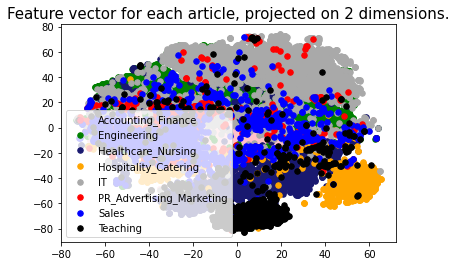

In [ ]:
features = weighted_preTGloVe_dvs.to_numpy()

plotTSNE(df['Category'], features)

<span style='font-family:Georgia;color:Blue;background:yellow'>Obervation</span>

1. Some categoies overlap.

2. `Engineering` and `IT` clusters are ver close as compared with `Hospitality` which appears clustered away from others with least overlap.

## 3. Job Advertisement Classification

It is required to build a classification model to classify documents into 8 categories in order to answer the follwoing question 

<span style='font-family:Georgia;color:Blue;background:yellow'>Which language model we built previously (based on job advertisement descriptions) performs the best with the chosen machine learning model?</span>



## 3.1 Classify documents based on descriptions

### 3.1.1 Document Classification using Bag of words model

In [ ]:
# lets first observe the labels into which the classification must be done
df_labels = pd.read_csv('labels.csv')

In [ ]:
df_labels.head()

,jobID,Category
0,14624,Engineering
1,31567,Healthcare_Nursing
2,50131,Hospitality_Catering
3,31419,Healthcare_Nursing
4,47238,Teaching


In [ ]:
# we observe that there are 8 categories and It has the highest number of job files in the data folder

stats = df_labels.groupby('Category').count()
print(stats)

                          jobID
Category                       
Accounting_Finance         7407
Engineering                8210
Healthcare_Nursing         8808
Hospitality_Catering       4788
IT                        14353
PR_Advertising_Marketing   2755
Sales                      5349
Teaching                   3779


<AxesSubplot:xlabel='Category'>

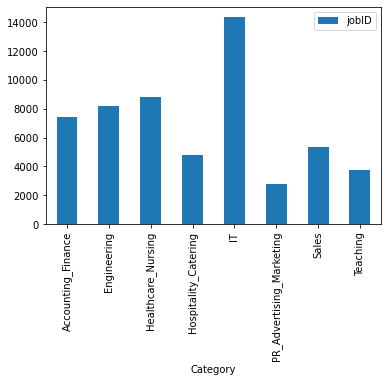

In [ ]:
stats.plot.bar(ylim=0)

In [ ]:
def gen_labels(aid_fname,df_labels):
    
    # create empty label list
    labels = [] 
    
    with open(aid_fname) as lf: 
        job_ids = lf.read().splitlines() 
        
    # for each document ID
    for aid in job_ids: 
        
        # append the corresponding label to the label list
        labels.append(df_labels.loc[df_labels.jobID == int(aid)].Category.squeeze()) 
        
    # return the list of labels and the list of document ids
    return labels, job_ids 


In [ ]:
labels, job_ids = gen_labels("job_IDs.txt",df_labels)


In [ ]:
labels

['Engineering',
 'Healthcare_Nursing',
 'Hospitality_Catering',
 'Healthcare_Nursing',
 'Teaching',
 'Healthcare_Nursing',
 'Healthcare_Nursing',
 'PR_Advertising_Marketing',
 'IT',
 'Sales',
 'IT',
 'IT',
 'Healthcare_Nursing',
 'IT',
 'Hospitality_Catering',
 'IT',
 'Engineering',
 'Sales',
 'Teaching',
 'Teaching',
 'IT',
 'IT',
 'IT',
 'Sales',
 'Hospitality_Catering',
 'Healthcare_Nursing',
 'Healthcare_Nursing',
 'IT',
 'IT',
 'IT',
 'IT',
 'Engineering',
 'Teaching',
 'Engineering',
 'Hospitality_Catering',
 'PR_Advertising_Marketing',
 'IT',
 'Engineering',
 'IT',
 'Teaching',
 'Healthcare_Nursing',
 'IT',
 'Hospitality_Catering',
 'Sales',
 'Sales',
 'Hospitality_Catering',
 'Hospitality_Catering',
 'IT',
 'IT',
 'Hospitality_Catering',
 'IT',
 'Healthcare_Nursing',
 'Healthcare_Nursing',
 'Engineering',
 'Sales',
 'Healthcare_Nursing',
 'Accounting_Finance',
 'Healthcare_Nursing',
 'PR_Advertising_Marketing',
 'IT',
 'Teaching',
 'Accounting_Finance',
 'PR_Advertising_Marketi

In [ ]:
job_ids

['14624',
 '31567',
 '50131',
 '31419',
 '47238',
 '36205',
 '30175',
 '54070',
 '05781',
 '44021',
 '02465',
 '13082',
 '36404',
 '13998',
 '51419',
 '07060',
 '18399',
 '39194',
 '44876',
 '47390',
 '08890',
 '02696',
 '00468',
 '39671',
 '52467',
 '31620',
 '32012',
 '06821',
 '13089',
 '05164',
 '01998',
 '20455',
 '46705',
 '15154',
 '50111',
 '52754',
 '09944',
 '18991',
 '10976',
 '45145',
 '30000',
 '09713',
 '50285',
 '43066',
 '43015',
 '50205',
 '49829',
 '05736',
 '13136',
 '51362',
 '09825',
 '31939',
 '30884',
 '14843',
 '42277',
 '31834',
 '28281',
 '35064',
 '53016',
 '06594',
 '46647',
 '23599',
 '53176',
 '20842',
 '54347',
 '21895',
 '04243',
 '04431',
 '39265',
 '04778',
 '28251',
 '00205',
 '25094',
 '21655',
 '54708',
 '11778',
 '19802',
 '15400',
 '47553',
 '35715',
 '29910',
 '11775',
 '12634',
 '20517',
 '01946',
 '40929',
 '28502',
 '11197',
 '21182',
 '25544',
 '04297',
 '04836',
 '47960',
 '18773',
 '43268',
 '18032',
 '28013',
 '00835',
 '22435',
 '18149',


In [ ]:
def str2vec(vec_str,voc_size): # doc_vec is a string of the format `word_index:value word_index:value word_index:value ...''
    doc_vec = [0] * voc_size # construct a document vector of the vocabular size
    # processing the vec_str
    for pair in vec_str.split(' '): # split with ' ' such that each pair is an entry `word_index:value`
        w_ind = int(pair.split(':')[0]) # split with ':' to get the word_index from the 1st element
        w_freq = float(pair.split(':')[1]) # split with ':' to get the value from the 2nd element
        doc_vec[w_ind] = w_freq # write the value to the element on the word_index
    return doc_vec


In [ ]:

def vecF2matrix(vec_fname,voc_size): # return the matrix representaion for the corpus
    with open(vec_fname) as vecf:
        vec_strings = vecf.readlines() # reading a list of strings, each for a document/article
    doc_vectors = [str2vec(vstr.strip(),voc_size) for vstr in vec_strings] # construct the matrix representation for the corpus                                                                  # by calling the 'str2vec' function for each line/string
    return csr_matrix(doc_vectors) # convert the sparse matrix into csr format and return the obtain csr matrix


In [ ]:
voc_fname = 'vocab.txt'
with open(voc_fname) as vocf: 
    voc_size = len(vocf.readlines())


In [ ]:
# reconstructing the count vector representations
count_features = vecF2matrix('count_vectors_further.txt',voc_size)

In [ ]:
count_features

<55449x40038 sparse matrix of type '<class 'numpy.float64'>'
	with 4734002 stored elements in Compressed Sparse Row format>

In [ ]:
seed = 0

# creating training and test split
X_train, X_test, y_train, y_test = train_test_split(count_features, labels, test_size=0.33, random_state=seed)

# create a LR model
model = LogisticRegression(random_state=seed)

# fit training data in the model
model.fit(X_train, y_train)

# get score/accuracy of the model
model.score(X_test, y_test)

/Users/bhartisinha/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


0.8756762664626482

In [ ]:
# make a prediction
y_pred = model.predict(X_test)

Text(0.5, 14.09375, 'Predicted')

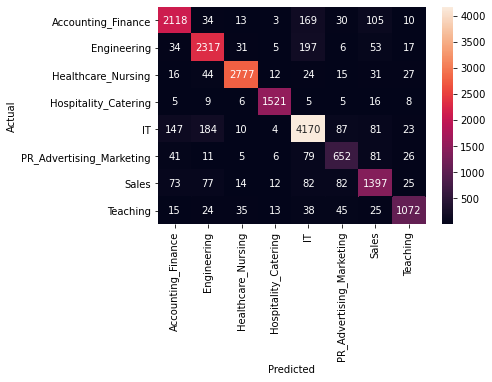

In [ ]:
conf_mat = confusion_matrix(y_test, y_pred)
print(conf_mat)

# set gives unique lables and then sort the list
categories = sorted(list(set(labels))) 

# creates a heatmap from the confusion matrix
sns.heatmap(conf_mat, annot=True, fmt='d',
            xticklabels=categories, yticklabels=categories) 
plt.ylabel('Actual')
plt.xlabel('Predicted')

### To make the results robust we will use k-fold cross validation

In [ ]:
num_folds = 5
kf = KFold(n_splits= num_folds, random_state=seed, shuffle = True) # initialise a 5 fold validation
print(kf)


KFold(n_splits=5, random_state=0, shuffle=True)


In [ ]:
def evaluate(X_train, X_test, y_train, y_test, seed, type_model=None):
    
    if type_model == "count_vec":
        model = LogisticRegression(random_state=seed)
           
    else:
        model = LogisticRegression(max_iter = 1000,random_state=seed)
        
    model.fit(X_train, y_train)         
    return model.score(X_test, y_test)

### 3.1.2 Document classification using Bag of words model, FastText, pre-trained Word2Vec,  pre-trained Glove

In [ ]:
num_models = 7
df_models_performance = pd.DataFrame(columns = ['count', 'fastText_unweigh','fastText_weigh', 'word2vec_unweigh', 'word2vec_weigh', 
                               'glove_unweigh', 'glove_weigh'], index=range(num_folds)) 


fold = 0
for train_index, test_index in kf.split(list(range(0,len(labels)))):
    
    y_train = [labels[i] for i in train_index]
    y_test = [labels[i] for i in test_index]
    
    
    X_train_count, X_test_count = count_features[train_index], count_features[test_index]
    df_models_performance.loc[fold,'count'] = evaluate(count_features[train_index],count_features[test_index],
                                                       y_train, y_test, seed, type_model="count_vec")

    
    X_train_count, X_test_count = jobAdFT_dvs.loc[train_index], jobAdFT_dvs.loc[test_index]
    df_models_performance.loc[fold,'fastText_unweigh'] = evaluate(jobAdFT_dvs.loc[train_index], jobAdFT_dvs.loc[test_index],
                                                  y_train, y_test, seed)
    
    
    X_train_count, X_test_count = weighted_jobAdFT_dvs.loc[train_index], weighted_jobAdFT_dvs.loc[test_index]
    df_models_performance.loc[fold,'fastText_weigh'] = evaluate(weighted_jobAdFT_dvs.loc[train_index], weighted_jobAdFT_dvs.loc[test_index],
                                                  y_train, y_test, seed)
    
    
    X_train_count, X_test_count = preTW2v_dvs.loc[train_index], preTW2v_dvs.loc[test_index]
    df_models_performance.loc[fold,'word2vec_unweigh'] = evaluate(preTW2v_dvs.loc[train_index], preTW2v_dvs.loc[test_index],
                                                  y_train, y_test, seed)
    
    
    X_train_count, X_test_count = weighted_preTW2v_dvs.loc[train_index], weighted_preTW2v_dvs.loc[test_index]
    df_models_performance.loc[fold,'word2vec_weigh'] = evaluate(weighted_preTW2v_dvs.loc[train_index], weighted_preTW2v_dvs.loc[test_index],
                                                  y_train, y_test, seed)
    
    
    X_train_count, X_test_count = preTGloVe_dvs.loc[train_index], preTGloVe_dvs.loc[test_index]
    df_models_performance.loc[fold,'glove_unweigh'] = evaluate(preTGloVe_dvs.loc[train_index], preTGloVe_dvs.loc[test_index],
                                                  y_train, y_test, seed)
    
    
    X_train_count, X_test_count = weighted_preTGloVe_dvs.loc[train_index], weighted_preTGloVe_dvs.loc[test_index]
    df_models_performance.loc[fold,'glove_weigh'] = evaluate(weighted_preTGloVe_dvs.loc[train_index], weighted_preTGloVe_dvs.loc[test_index],
                                                  y_train, y_test, seed)
    fold +=1
    
    
    
    

/Users/bhartisinha/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/bhartisinha/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_mode

/Users/bhartisinha/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/bhartisinha/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_mode

In [ ]:
df_models_performance

,count,fastText_unweigh,fastText_weigh,word2vec_unweigh,word2vec_weigh,glove_unweigh,glove_weigh
0,0.874391,0.864833,0.870243,0.859874,0.866637,0.835528,0.832552
1,0.877277,0.867358,0.875203,0.859874,0.863030,0.841749,0.837692
2,0.872408,0.868891,0.873760,0.859603,0.865014,0.836069,0.835978
3,0.871326,0.866997,0.870063,0.855455,0.859243,0.836159,0.833544
4,0.872216,0.874109,0.878258,0.864100,0.870232,0.842186,0.837857


In [ ]:
df_models_performance.to_csv("model_performance")

Continued in Document_Modeling_2 
